In [18]:
import math
import numpy as np
np.random.seed(24)
import pandas as pd
from tqdm import tqdm

from sympy import *
import operator
from IPython.core.display import display

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.preprocessing import StandardScaler

import torch
torch.manual_seed(24)
from torch.autograd import Variable
import torch.utils.data as data_utils
import torch.nn.init as init
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')
sns.set_palette("bright")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Load and Prepare Data

In [19]:
data = load_breast_cancer()

In [20]:
X = data['data']
y = data['target']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=24)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.5, random_state=24)
X_train = Variable(torch.from_numpy(X_train))
X_val = Variable(torch.from_numpy(X_val))
y_train = Variable(torch.from_numpy(y_train))
y_val = Variable(torch.from_numpy(y_val))
X_test = Variable(torch.from_numpy(X_test))
y_test = Variable(torch.from_numpy(y_test))

In [21]:
X.shape

(569, 30)

In [22]:
df_data = pd.DataFrame(X, columns=data['feature_names'])
df_data['target'] = y
df_benign = df_data[df_data['target'] == 1].reset_index(drop=True)
df_malignant = df_data[df_data['target'] == 0].reset_index(drop=True)

In [23]:
df_train = pd.DataFrame(X_train, columns=data['feature_names'])
df_train['target'] = y_train
df_val = pd.DataFrame(X_val, columns=data['feature_names'])
df_val['target'] = y_val
df_test = pd.DataFrame(X_test, columns=data['feature_names'])
df_test['target'] = y_test

# Exploratory Data Analysis

In [24]:
df_data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [25]:
df_data['target'].value_counts() / len(df_data) * 100

1    62.741652
0    37.258348
Name: target, dtype: float64

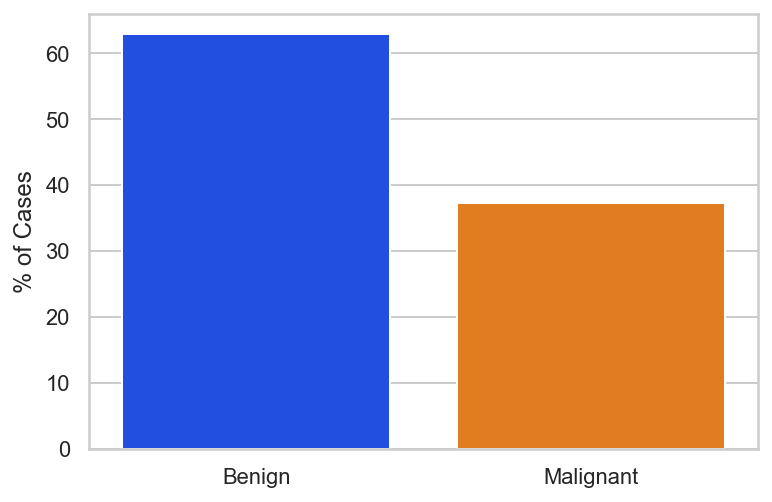

In [26]:
class_names = ['Benign', 'Malignant']
class_pc = [62.8, 37.3]
f, ax = plt.subplots()
sns.barplot(x=class_names, y=class_pc, ax=ax)
ax.set_ylabel('% of Cases')
f.savefig('images/chapter_04_class_pc.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_class_pc.pdf', format='pdf', dpi=300, bbox_inches='tight');

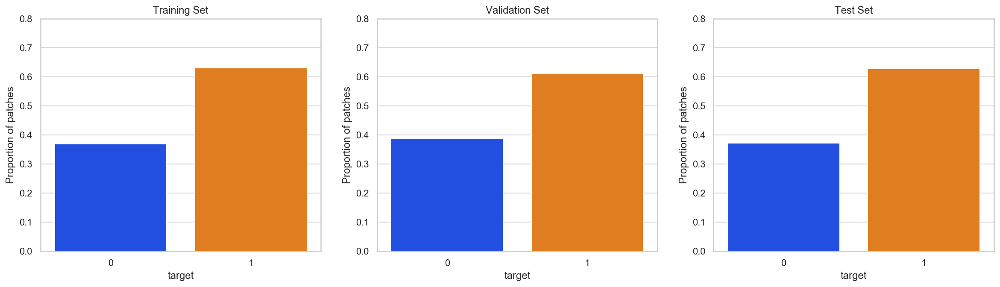

In [27]:
f, ax = plt.subplots(1, 3, figsize=(20, 5))
df_train['target'].\
    value_counts(normalize=True).\
    rename('pc').reset_index().\
    rename(columns={'index': 'target'}).\
    pipe((sns.barplot, "data"), x='target', y='pc', ax=ax[0])
df_val['target'].\
    value_counts(normalize=True).\
    rename('pc').reset_index().\
    rename(columns={'index': 'target'}).\
    pipe((sns.barplot, "data"), x='target', y='pc', ax=ax[1])
df_test['target'].\
    value_counts(normalize=True).\
    rename('pc').reset_index().\
    rename(columns={'index': 'target'}).\
    pipe((sns.barplot, "data"), x='target', y='pc', ax=ax[2])
ax[0].set_ylabel('Proportion of patches')
ax[1].set_ylabel('Proportion of patches')
ax[2].set_ylabel('Proportion of patches')
ax[0].set_ylim([0, 0.8])
ax[1].set_ylim([0, 0.8])
ax[2].set_ylim([0, 0.8])
ax[0].set_title('Training Set')
ax[1].set_title('Validation Set')
ax[2].set_title('Test Set');
f.savefig('images/chapter_04_train_val_test_splits.png', dpi=300, bbox_inches='tight')
f.savefig('images/chapter_04_train_val_test_splits.pdf', format='pdf', dpi=300, bbox_inches='tight')

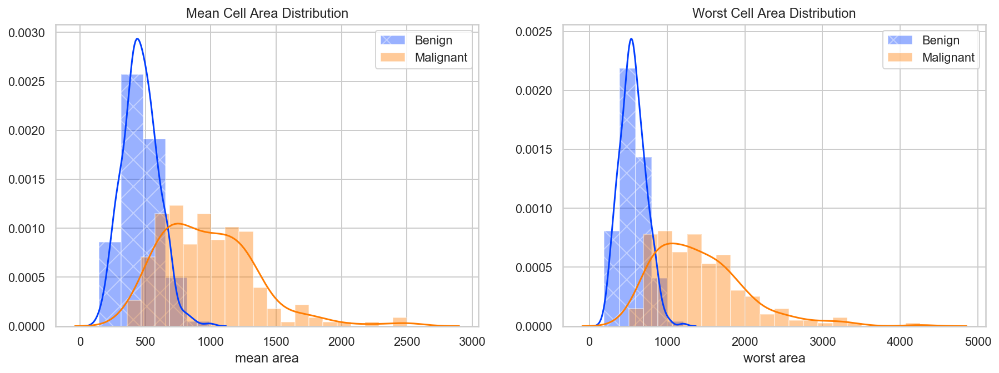

In [28]:
f, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(df_benign['mean area'], 
             bins=5, 
             ax=ax[0], 
             label='Benign',
             hist_kws={"hatch": "x"})
sns.distplot(df_malignant['mean area'], bins=20, ax=ax[0], label='Malignant')
ax[0].legend()
sns.distplot(df_benign['worst area'], bins=5, ax=ax[1], label='Benign',
             hist_kws={"hatch": "x"})
sns.distplot(df_malignant['worst area'], bins=20, ax=ax[1], label='Malignant')
ax[1].legend()
ax[0].set_title('Mean Cell Area Distribution')
ax[1].set_title('Worst Cell Area Distribution')
f.savefig('images/chapter_04_cell_area_dist.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_cell_area_dist.pdf', format='pdf', dpi=300, bbox_inches='tight');

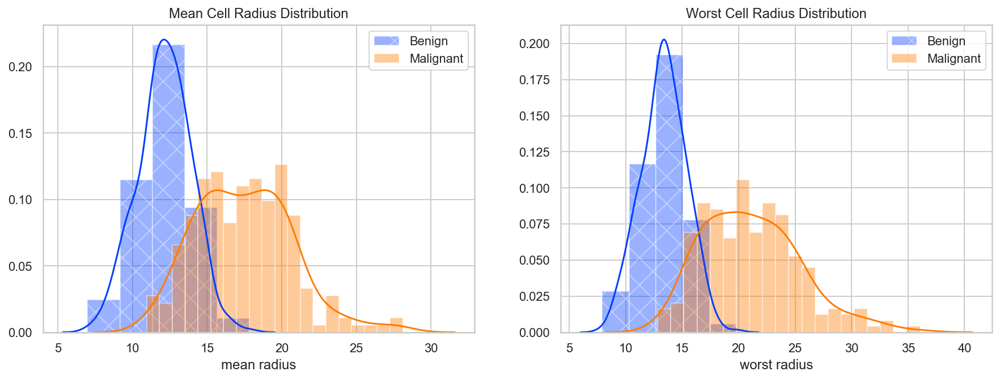

In [29]:
f, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(df_benign['mean radius'], bins=5, ax=ax[0], label='Benign',
             hist_kws={"hatch": "x"})
sns.distplot(df_malignant['mean radius'], bins=20, ax=ax[0], label='Malignant')
sns.distplot(df_benign['worst radius'], bins=5, ax=ax[1], label='Benign',
             hist_kws={"hatch": "x"})
sns.distplot(df_malignant['worst radius'], bins=20, ax=ax[1], label='Malignant')
ax[0].legend()
ax[1].legend()
ax[0].set_title('Mean Cell Radius Distribution')
ax[1].set_title('Worst Cell Radius Distribution')
f.savefig('images/chapter_04_cell_radius_dist.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_cell_radius_dist.pdf', format='pdf', dpi=300, bbox_inches='tight');

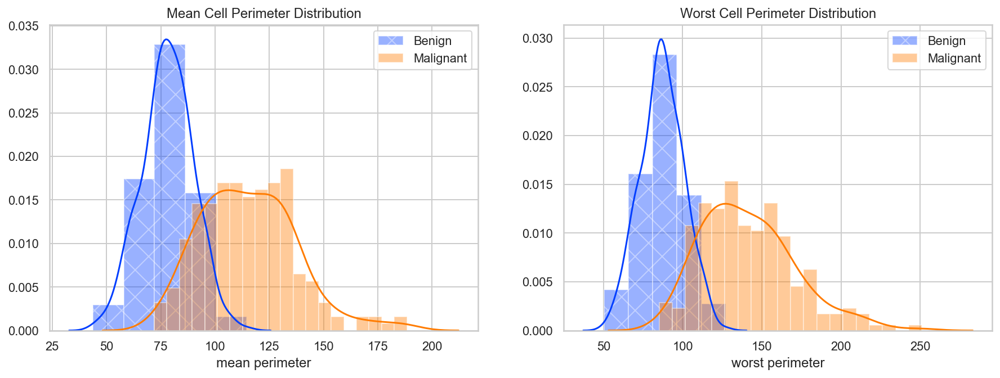

In [30]:
f, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(df_benign['mean perimeter'], bins=5, ax=ax[0], label='Benign',
             hist_kws={"hatch": "x"})
sns.distplot(df_malignant['mean perimeter'], bins=20, ax=ax[0], label='Malignant')
sns.distplot(df_benign['worst perimeter'], bins=5, ax=ax[1], label='Benign',
             hist_kws={"hatch": "x"})
sns.distplot(df_malignant['worst perimeter'], bins=20, ax=ax[1], label='Malignant')
ax[0].legend()
ax[1].legend()
ax[0].set_title('Mean Cell Perimeter Distribution')
ax[1].set_title('Worst Cell Perimeter Distribution')
f.savefig('images/chapter_04_cell_perimeter_dist.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_cell_perimeter_dist.pdf', format='pdf', dpi=300, bbox_inches='tight');

In [31]:
corr = df_data.corr()

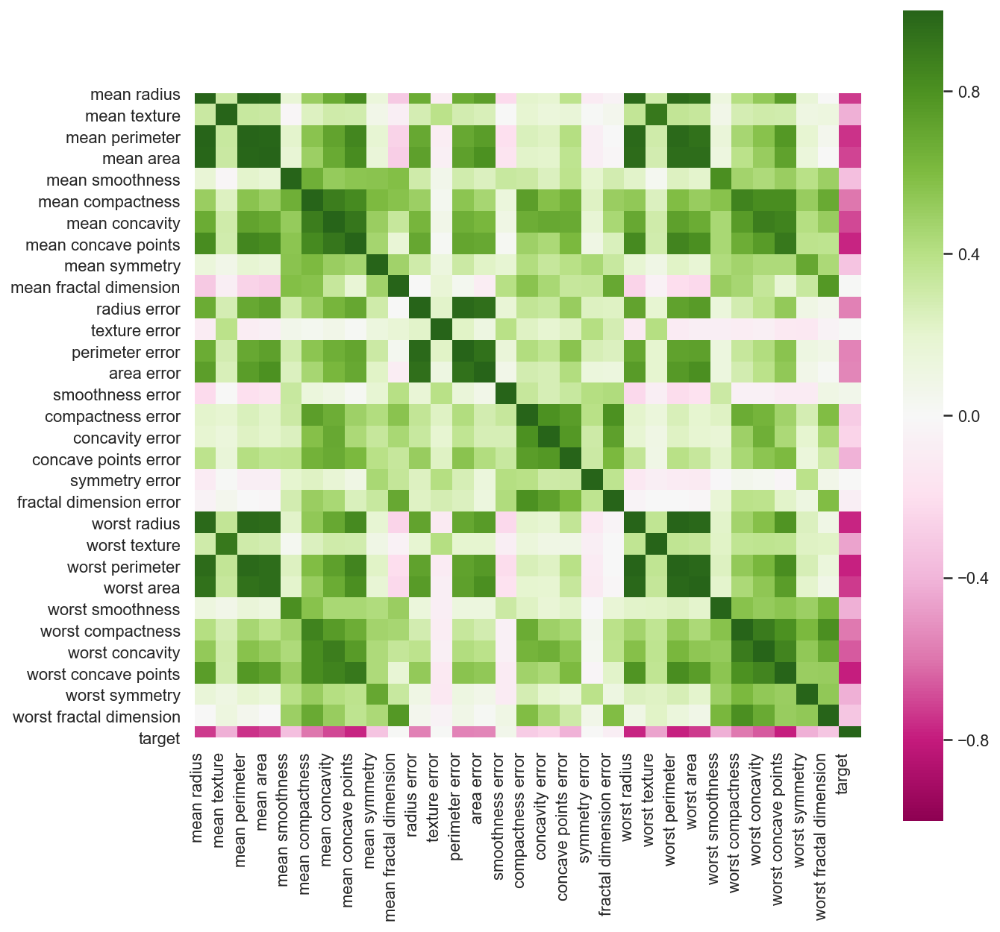

In [32]:
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap="PiYG",
    square=True,
    ax=ax
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);
f.savefig('images/chapter_04_feature_correlation.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_feature_correlation.pdf', format='pdf', dpi=300, bbox_inches='tight');

In [33]:
X_train.shape

torch.Size([398, 30])

In [34]:
X_val.shape

torch.Size([85, 30])

In [35]:
y_train.shape

torch.Size([398])

In [36]:
y_val.shape

torch.Size([85])

In [37]:
X_test.shape

torch.Size([86, 30])

In [38]:
y_test.shape

torch.Size([86])

# Create and Train Model

In [39]:
class Model(torch.nn.Sequential):
    def __init__(self, layer_dims):
        super(Model, self).__init__()
        for idx, dim in enumerate(layer_dims):
            if (idx < len(layer_dims) - 1):
                module = torch.nn.Linear(dim, layer_dims[idx + 1])
                self.add_module("linear" + str(idx), module)
            else:
                self.add_module("sig" + str(idx), torch.nn.Sigmoid())
            if (idx < len(layer_dims) - 2):
                self.add_module("relu" + str(idx), torch.nn.ReLU())

In [40]:
dim_in = X_train.shape[1]
dim_out = 1
layer_dims = [dim_in, 20, 10, 5, dim_out]
model = Model(layer_dims)
print(model)

Model(
  (linear0): Linear(in_features=30, out_features=20, bias=True)
  (relu0): ReLU()
  (linear1): Linear(in_features=20, out_features=10, bias=True)
  (relu1): ReLU()
  (linear2): Linear(in_features=10, out_features=5, bias=True)
  (relu2): ReLU()
  (linear3): Linear(in_features=5, out_features=1, bias=True)
  (sig4): Sigmoid()
)


In [41]:
criterion = torch.nn.BCELoss(reduction='sum')
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 300
history = { "loss": [], "accuracy": [], "loss_val": [], "accuracy_val": [] }
for epoch in range(num_epochs):
    y_pred = model(X_train.float())
    loss = criterion(y_pred, y_train.view(-1, 1).float())
    prediction = [1 if p > 0.5 else 0 for p in y_pred.data.numpy()]
    correct = (prediction == y_train.numpy()).mean()
    
    y_pred_val = model(X_val.float())
    loss_val = criterion(y_pred_val, y_val.view(-1,1).float())
    prediction_val = [1 if p > 0.5 else 0 for p in y_pred_val.data.numpy()]
    correct_val = (prediction_val == y_val.numpy()).mean()
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    print('Epoch', epoch, 'Loss:', loss.item(), '- Pred:', y_pred.data[0])
    history["loss"].append(loss.item())
    history["accuracy"].append(100 * correct)
    history["loss_val"].append(loss_val.data.item())
    history["accuracy_val"].append(100 * correct_val)

Epoch 0 Loss: 793.4531860351562 - Pred: tensor([0.1266])
Epoch 1 Loss: 677.9299926757812 - Pred: tensor([0.1678])
Epoch 2 Loss: 596.9193115234375 - Pred: tensor([0.1825])
Epoch 3 Loss: 564.4810791015625 - Pred: tensor([0.1993])
Epoch 4 Loss: 536.34619140625 - Pred: tensor([0.2175])
Epoch 5 Loss: 509.9817199707031 - Pred: tensor([0.2363])
Epoch 6 Loss: 484.6954345703125 - Pred: tensor([0.2509])
Epoch 7 Loss: 460.24542236328125 - Pred: tensor([0.2658])
Epoch 8 Loss: 436.6437683105469 - Pred: tensor([0.2822])
Epoch 9 Loss: 413.9733581542969 - Pred: tensor([0.2990])
Epoch 10 Loss: 392.40411376953125 - Pred: tensor([0.3155])
Epoch 11 Loss: 372.0784912109375 - Pred: tensor([0.3319])
Epoch 12 Loss: 353.13531494140625 - Pred: tensor([0.3485])
Epoch 13 Loss: 335.7137756347656 - Pred: tensor([0.3651])
Epoch 14 Loss: 319.9837341308594 - Pred: tensor([0.3816])
Epoch 15 Loss: 306.02716064453125 - Pred: tensor([0.3980])
Epoch 16 Loss: 293.8887939453125 - Pred: tensor([0.4138])
Epoch 17 Loss: 283.545

Epoch 151 Loss: 205.89227294921875 - Pred: tensor([0.5195])
Epoch 152 Loss: 205.6916046142578 - Pred: tensor([0.5197])
Epoch 153 Loss: 205.4903564453125 - Pred: tensor([0.5199])
Epoch 154 Loss: 205.29066467285156 - Pred: tensor([0.5202])
Epoch 155 Loss: 205.09390258789062 - Pred: tensor([0.5204])
Epoch 156 Loss: 204.90005493164062 - Pred: tensor([0.5206])
Epoch 157 Loss: 204.7045135498047 - Pred: tensor([0.5209])
Epoch 158 Loss: 204.51097106933594 - Pred: tensor([0.5211])
Epoch 159 Loss: 204.31826782226562 - Pred: tensor([0.5213])
Epoch 160 Loss: 204.1233673095703 - Pred: tensor([0.5215])
Epoch 161 Loss: 203.92782592773438 - Pred: tensor([0.5218])
Epoch 162 Loss: 203.73175048828125 - Pred: tensor([0.5220])
Epoch 163 Loss: 203.54226684570312 - Pred: tensor([0.5222])
Epoch 164 Loss: 203.35971069335938 - Pred: tensor([0.5225])
Epoch 165 Loss: 203.17181396484375 - Pred: tensor([0.5227])
Epoch 166 Loss: 202.97711181640625 - Pred: tensor([0.5229])
Epoch 167 Loss: 202.79132080078125 - Pred: t

Epoch 289 Loss: 185.27169799804688 - Pred: tensor([0.5517])
Epoch 290 Loss: 185.15232849121094 - Pred: tensor([0.5519])
Epoch 291 Loss: 185.03311157226562 - Pred: tensor([0.5522])
Epoch 292 Loss: 184.91400146484375 - Pred: tensor([0.5524])
Epoch 293 Loss: 184.79502868652344 - Pred: tensor([0.5526])
Epoch 294 Loss: 184.67611694335938 - Pred: tensor([0.5529])
Epoch 295 Loss: 184.55740356445312 - Pred: tensor([0.5531])
Epoch 296 Loss: 184.4385986328125 - Pred: tensor([0.5533])
Epoch 297 Loss: 184.31869506835938 - Pred: tensor([0.5536])
Epoch 298 Loss: 184.19898986816406 - Pred: tensor([0.5538])
Epoch 299 Loss: 184.08236694335938 - Pred: tensor([0.5540])


In [56]:
torch.save(model, 'models/chapter_04_bc_dnn.mdl')

# Evaluate Model

In [42]:
model = torch.load('models/chapter_04_bc_dnn.mdl')

In [43]:
y_pred_test = model.forward(X_test.float()) > 0.5

In [44]:
y_conf = model.forward(X_test.float()).detach().numpy().reshape(-1)

In [45]:
pred = y_pred_test.numpy().reshape(-1)
actual = y_test.numpy()
baseline = np.array([1 for _ in range(len(actual))])

In [46]:
from sklearn.metrics import recall_score, precision_score, f1_score

precision = precision_score(actual, pred)
p_baseline = precision_score(actual, baseline)
r_baseline = recall_score(actual, baseline)
recall = recall_score(actual, pred)
f1 = f1_score(actual, pred)
f1_baseline = f1_score(actual, baseline)
print('Precision: ', precision, 'Recall: ', recall, 'F1: ', f1)
print('(Baseline) Precision: ', p_baseline, 'Recall: ', r_baseline, 'F1: ', f1_baseline)

Precision:  1.0 Recall:  0.9259259259259259 F1:  0.9615384615384615
(Baseline) Precision:  0.627906976744186 Recall:  1.0 F1:  0.7714285714285715


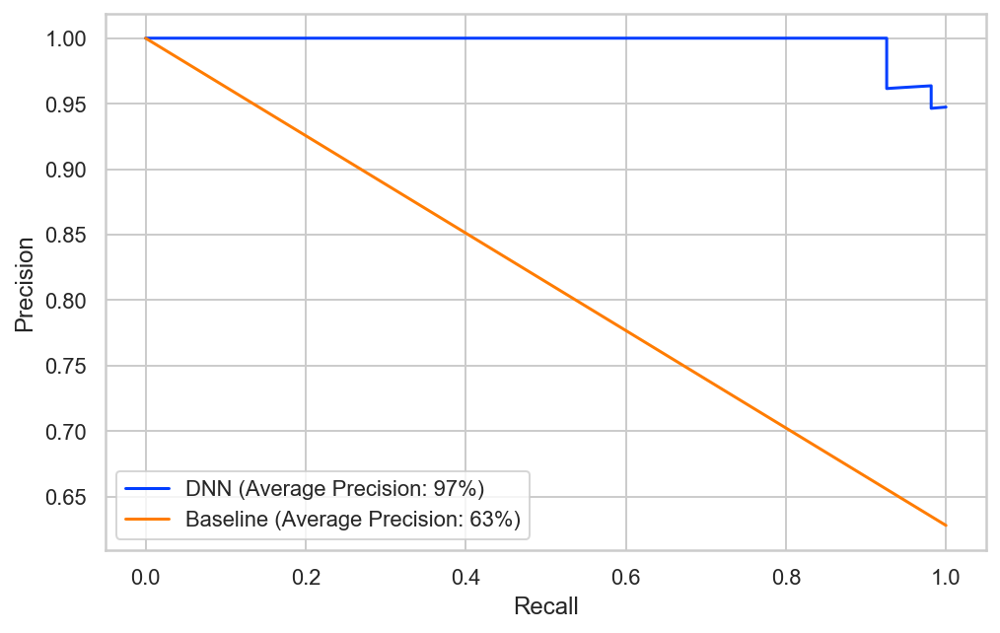

In [47]:
from sklearn.metrics import average_precision_score
pred_p, pred_r, _ = precision_recall_curve(actual, y_conf)
baseline_p, baseline_r, _ = precision_recall_curve(actual, baseline)
pred_ap = average_precision_score(actual, pred)
baseline_ap = average_precision_score(actual, baseline)
f, ax = plt.subplots(figsize=(8, 5))
ax.plot(pred_r, pred_p, label='DNN (Average Precision: %d%%)' % round(pred_ap * 100))
ax.plot(baseline_r, baseline_p, label='Baseline (Average Precision: %d%%)' % round(baseline_ap * 100))
ax.legend()
ax.set_xlabel('Recall')
ax.set_ylabel('Precision');
f.savefig('images/chapter_04_pr_curve.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_pr_curve.svg', format='svg', dpi=300, bbox_inches='tight');

# Model Complexity

In [175]:
from prettytable import PrettyTable

def count_parameters(model):
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params+=param
    print(table)
    print(f"Total Trainable Parameters: {total_params}")
    return total_params
    
count_parameters(model)

+----------------+------------+
|    Modules     | Parameters |
+----------------+------------+
| linear0.weight |    600     |
|  linear0.bias  |     20     |
| linear1.weight |    200     |
|  linear1.bias  |     10     |
| linear2.weight |     50     |
|  linear2.bias  |     5      |
| linear3.weight |     5      |
|  linear3.bias  |     1      |
+----------------+------------+
Total Trainable Parameters: 891


891

# LIME Explainer

In [67]:
import lime
import lime.lime_tabular

In [68]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.numpy(), 
                                                   feature_names=data.feature_names, 
                                                   class_names=data.target_names, 
                                                   discretize_continuous=True)

In [75]:
benign_idx = np.where(y_test.numpy() == 1)[0][0]
malignant_idx = np.where(y_test.numpy() == 0)[0][0]

In [76]:
benign_idx

0

In [77]:
malignant_idx

14

In [78]:
def lime_exp_as_pyplot(exp, label=0, figsize=(8,5)):
    exp_list = exp.as_list(label=label)
    fig, ax = plt.subplots(figsize=figsize)
    vals = [x[1] for x in exp_list]
    names = [x[0] for x in exp_list]
    vals.reverse()
    names.reverse()
    colors = ['green' if x > 0 else 'red' for x in vals]
    pos = np.arange(len(exp_list)) + .5
    ax.barh(pos, vals, align='center', color=colors)
    plt.yticks(pos, names)
    return fig, ax

In [79]:
def prob(data):
    return model.forward(Variable(torch.from_numpy(data)).float()).detach().numpy().reshape(-1, 1)

In [80]:
y_conf[benign_idx]

0.9914035

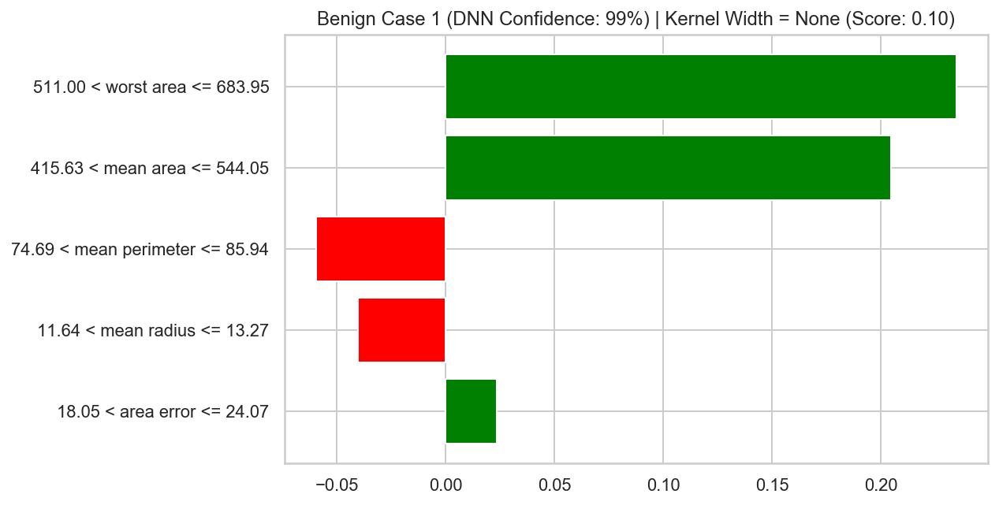

In [82]:
bc1_lime = explainer.explain_instance(X_test.numpy()[benign_idx], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Benign Case 1 (DNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (round(y_conf[benign_idx] * 100),
                                                                                            bc1_lime.score))
f.savefig('images/chapter_04_lime_benign.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign.pdf', format='pdf', dpi=300, bbox_inches='tight');

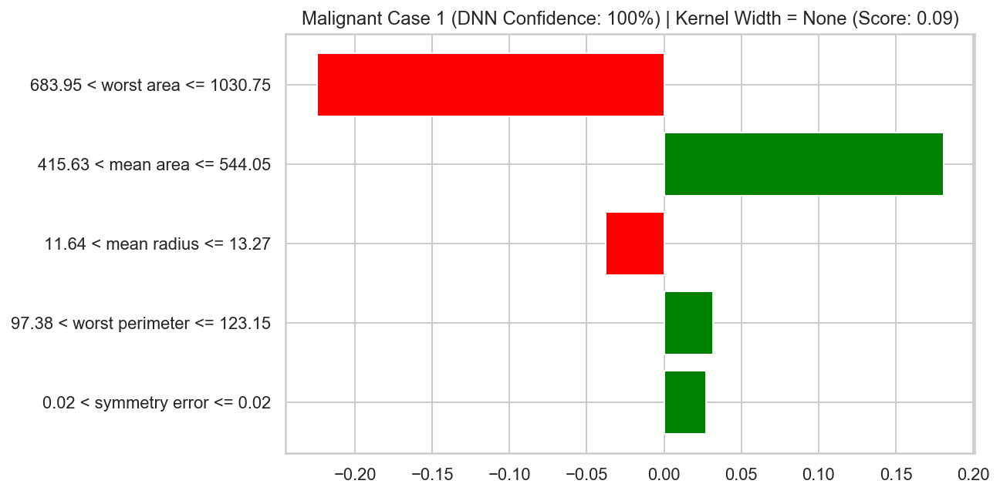

In [86]:
exp = explainer.explain_instance(X_test.numpy()[malignant_idx], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Malignant Case 1 (DNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (100 - round(y_conf[malignant_idx] * 100),
                                                                                               exp.score))
f.savefig('images/chapter_04_lime_malignant.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_malignant.pdf', format='pdf', dpi=300, bbox_inches='tight');

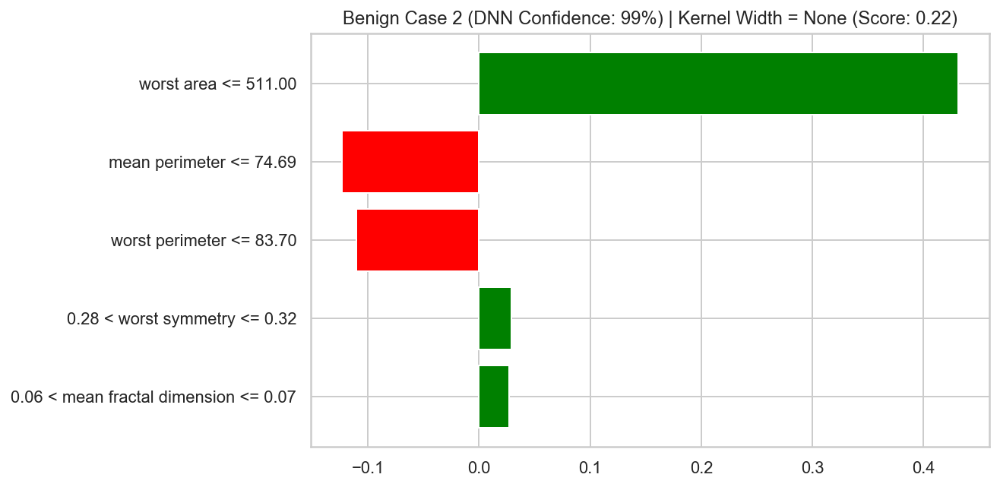

In [87]:
benign_idx2 = np.where(y_test.numpy() == 1)[0][1]
exp = explainer.explain_instance(X_test.numpy()[benign_idx2], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Benign Case 2 (DNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (round(y_conf[benign_idx2] * 100),
                                                                                            exp.score))
f.savefig('images/chapter_04_lime_benign2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign2.pdf', format='pdf', dpi=300, bbox_inches='tight');

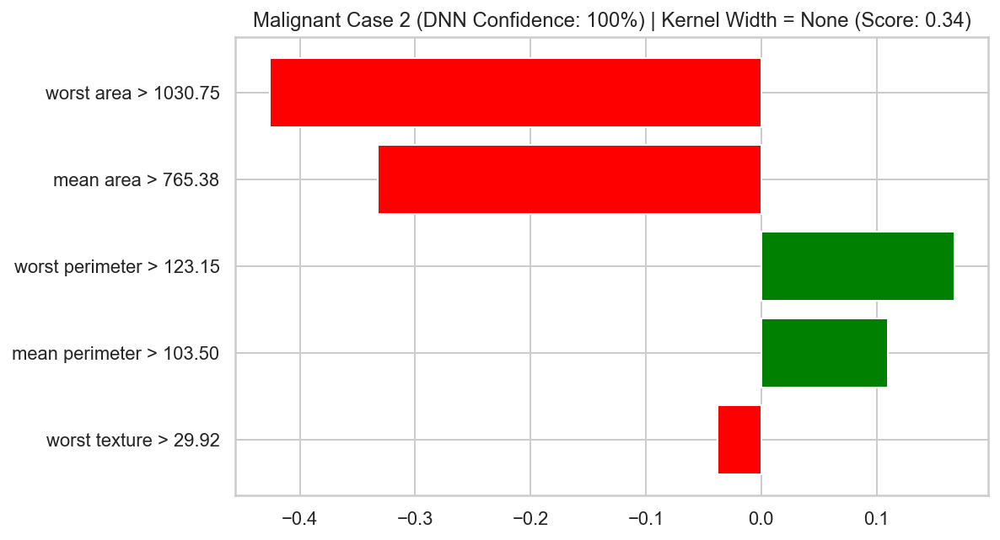

In [89]:
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]
exp = explainer.explain_instance(X_test.numpy()[malignant_idx2], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Malignant Case 2 (DNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (100 - round(y_conf[malignant_idx2] * 100),
                                                                                               exp.score))
f.savefig('images/chapter_04_lime_malignant2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_malignant2.pdf', format='pdf', dpi=300, bbox_inches='tight');

In [90]:
explainer_kw1 = lime.lime_tabular.LimeTabularExplainer(X_train.numpy(), 
                                                       feature_names=data.feature_names, 
                                                       class_names=data.target_names,
                                                       kernel_width=1,
                                                       discretize_continuous=True)

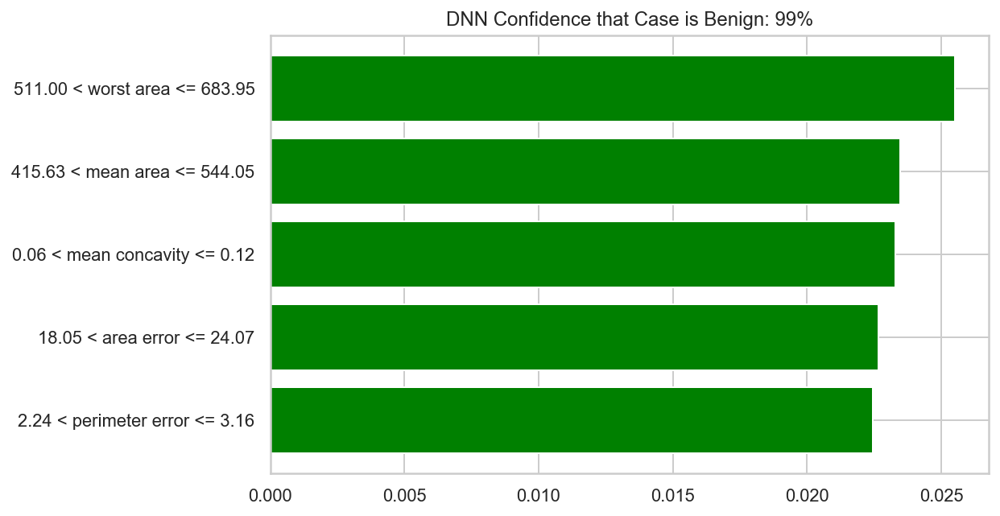

In [190]:
exp = explainer_kw1.explain_instance(X_test.numpy()[benign_idx], 
                                     prob, 
                                     num_features=5, 
                                     top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('DNN Confidence that Case is Benign: %d%%' % (round(y_conf[benign_idx] * 100)))
f.savefig('images/chapter_04_lime_benign_kw1.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign_kw1.pdf', format='pdf', dpi=300, bbox_inches='tight');

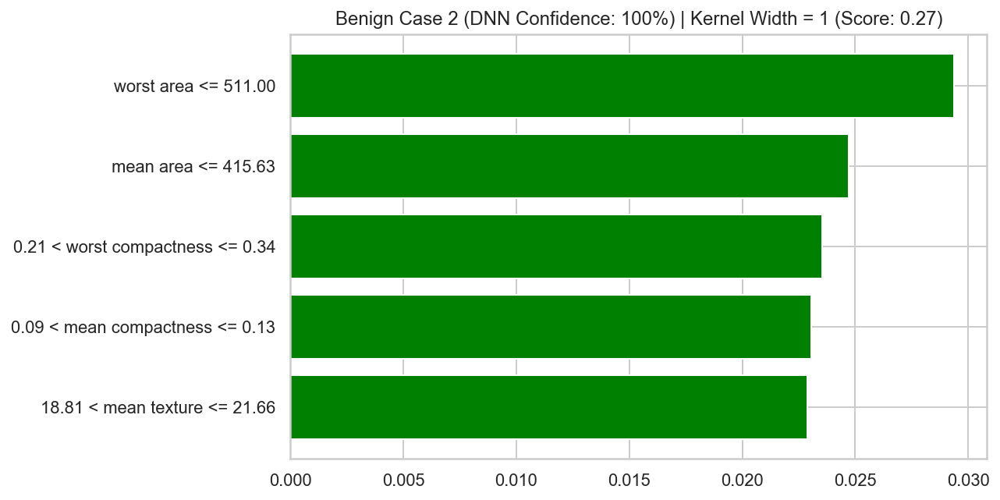

In [191]:
exp = explainer_kw1.explain_instance(X_test.numpy()[benign_idx2], 
                                     prob, 
                                     num_features=5, 
                                     top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Benign Case 2 (DNN Confidence: %d%%) | Kernel Width = 1 (Score: %.2f)' % (round(y_conf[benign_idx2] * 100),
                                                                                         exp.score))
f.savefig('images/chapter_04_lime_benign_kw1_2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign_kw1_2.pdf', format='pdf', dpi=300, bbox_inches='tight');

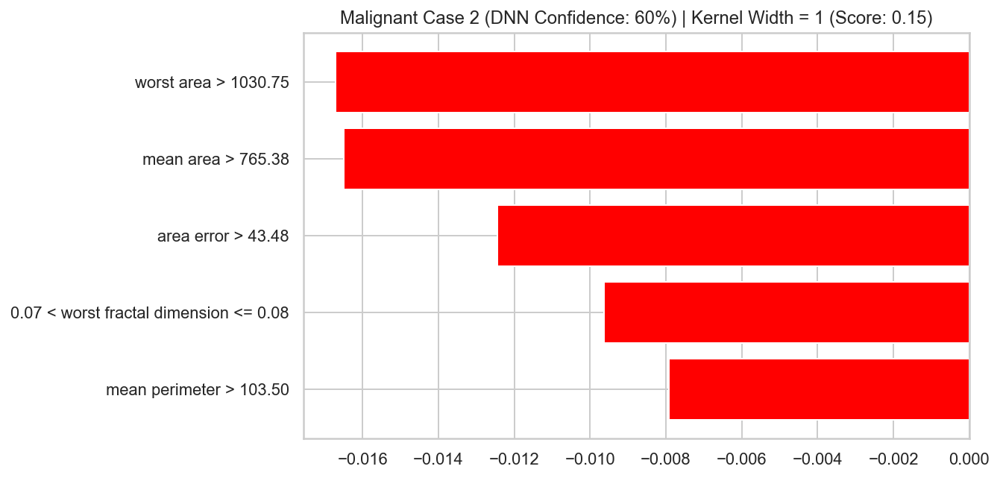

In [192]:
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]
exp = explainer_kw1.explain_instance(X_test.numpy()[malignant_idx2], 
                                     prob, 
                                     num_features=5, 
                                     top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Malignant Case 2 (DNN Confidence: %d%%) | Kernel Width = 1 (Score: %.2f)' % (100 - round(y_conf[malignant_idx2] * 100),
                                                                                          exp.score))
f.savefig('images/chapter_04_lime_malignant_kw1_2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_malignant_kw1_2.pdf', format='pdf', dpi=300, bbox_inches='tight');

In [94]:
exp.score

0.140393270251145

# SHAP Explainer

First uninstall shap and install from my github [fork](https://github.com/thampiman/shap) to be able to obtain the matplotlib figure and axes to allow for customizations and image exports. A [pull request](https://github.com/slundberg/shap/pull/1103) has been submitted to the base SHAP master branch but until that is merged, please use my github fork if you'd like to export matplotlib plots.

In [28]:
!pip uninstall -y shap
!pip install git+https://github.com/thampiman/shap

  Cloning https://github.com/thampiman/shap to /private/var/folders/gf/_x0rwz455l1_jjg78trkrlrc0000gn/T/pip-req-build-u1xzt_h7
  Running command git clone -q https://github.com/thampiman/shap /private/var/folders/gf/_x0rwz455l1_jjg78trkrlrc0000gn/T/pip-req-build-u1xzt_h7
  Created wheel for shap: filename=shap-0.35.0-cp37-cp37m-macosx_10_7_x86_64.whl size=311352 sha256=b8e7211a72a93776c3d5404e443e3e8888c7c6120a5474f88281d6a19528a18f
  Stored in directory: /private/var/folders/gf/_x0rwz455l1_jjg78trkrlrc0000gn/T/pip-ephem-wheel-cache-h_qqgwbr/wheels/18/ce/c4/2276771232fac42d0776f309e1dda9cc8d8d9380346993263e
Successfully built shap


In [137]:
import shap
# print the JS visualization code to the notebook
shap.initjs()

In [96]:
def prob(data):
    return model.forward(Variable(torch.from_numpy(data)).float()).detach().numpy().reshape(-1, 1)

In [97]:
shap_explainer = shap.KernelExplainer(prob, 
                                      X_train.numpy(), 
                                      link="logit")
shap_values = shap_explainer.shap_values(X_test.numpy(), nsamples=100)

Using 398 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [98]:
benign_idx = np.where(y_test.numpy() == 1)[0][0]
malignant_idx = np.where(y_test.numpy() == 0)[0][0]
benign_idx2 = np.where(y_test.numpy() == 1)[0][1]
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]

In [99]:
df_test = pd.DataFrame(X_test.numpy(), columns=data['feature_names'])

In [157]:
# Plot the SHAP values for the Benign case
plot = shap.force_plot(shap_explainer.expected_value[0], 
                       shap_values[0][benign_idx,:], 
                       X_test.numpy()[benign_idx,:],
                       feature_names=data['feature_names'],
                       link="logit")
shap.save_html('images/chapter_04_shap_benign.html', plot, full_html=True)
plot
# f.savefig('images/chapter_04_shap_benign.png', dpi=300, bbox_inches='tight');
# f.savefig('images/chapter_04_shap_benign.pdf', format='pdf', dpi=300, bbox_inches='tight');

In [158]:
# Plot the SHAP values for the Benign case
plot = shap.force_plot(shap_explainer.expected_value[0], 
                        shap_values[0][benign_idx2,:], 
                        X_test.numpy()[benign_idx2,:],
                        feature_names=data['feature_names'],
                        link="logit")
shap.save_html('images/chapter_04_shap_benign2.html', plot, full_html=True)
plot

In [159]:
# Plot the SHAP values for the Malignant case
plot = shap.force_plot(shap_explainer.expected_value[0], 
                       shap_values[0][malignant_idx,:], 
                       X_test.numpy()[malignant_idx,:], 
                       feature_names=data['feature_names'],
                       link="logit")
shap.save_html('images/chapter_04_shap_malignant.html', plot, full_html=True)
plot
# f.savefig('images/chapter_04_shap_malignant.png', dpi=300, bbox_inches='tight');
# f.savefig('images/chapter_04_shap_malignant.pdf', format='pdf', dpi=300, bbox_inches='tight');

In [161]:
# Plot the SHAP values for the Malignant case
plot = shap.force_plot(shap_explainer.expected_value[0], 
                       shap_values[0][malignant_idx2,:], 
                       X_test.numpy()[malignant_idx2,:], 
                       feature_names=data['feature_names'],
                       link="logit")
shap.save_html('images/chapter_04_shap_malignant2.html', plot, full_html=True)
plot
# f.savefig('images/chapter_04_shap_malignant2.png', dpi=300, bbox_inches='tight');
# f.savefig('images/chapter_04_shap_malignant2.pdf', format='pdf', dpi=300, bbox_inches='tight');

# Anchor Explainer

In [104]:
from anchor import utils
from anchor import anchor_tabular

In [105]:
data.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [106]:
anchor_explainer = anchor_tabular.AnchorTabularExplainer(
    data.target_names, 
    data.feature_names, 
    X_train.numpy(),
    categorical_names={})
anchor_explainer.fit(X_train.numpy(), 
                     y_train.numpy(), 
                     X_val.numpy(), 
                     y_val.numpy())

In [107]:
def pred(data):
    pred = model.forward(
        Variable(torch.from_numpy(data)).float()).\
    detach().numpy().reshape(-1) > 0.5
    return np.array([1 if p == True else 0 for p in pred])

In [108]:
benign_idx = np.where(y_test.numpy() == 1)[0][0]
malignant_idx = np.where(y_test.numpy() == 0)[0][0]
benign_idx2 = np.where(y_test.numpy() == 1)[0][1]
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]

In [109]:
exp = anchor_explainer.explain_instance(X_test.numpy()[benign_idx], 
                                        pred, 
                                        threshold=0.95)
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[benign_idx])][0])
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  benign
Anchor: worst area <= 683.95 AND mean radius <= 13.27
Precision: 1.000
Coverage: 0.443


In [110]:
exp.save_to_file('images/chapter_04_anchors_benign_explanation.html')
exp.show_in_notebook()

In [111]:
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[benign_idx2])][0])
exp = anchor_explainer.explain_instance(X_test.numpy()[benign_idx2], pred, threshold=0.95)
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  benign
Anchor: worst area <= 683.95 AND worst radius <= 12.98
Precision: 1.000
Coverage: 0.209


In [112]:
exp.save_to_file('images/chapter_04_anchors_benign_explanation2.html')
exp.show_in_notebook()

In [113]:
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[malignant_idx])][0])
exp = anchor_explainer.explain_instance(X_test.numpy()[malignant_idx], pred, threshold=0.95)
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  malignant
Anchor: worst area > 683.95 AND mean area <= 544.05
Precision: 1.000
Coverage: 0.012


In [114]:
exp.save_to_file('images/chapter_04_anchors_malignant_explanation.html')
exp.show_in_notebook()

In [115]:
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[malignant_idx2])][0])
exp = anchor_explainer.explain_instance(X_test.numpy()[malignant_idx2], pred, threshold=0.95)
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  malignant
Anchor: worst area > 1030.75
Precision: 1.000
Coverage: 0.271


In [116]:
exp.save_to_file('images/chapter_04_anchors_malignant_explanation2.html')
exp.show_in_notebook()